In [1]:
import numpy as np 
from matplotlib import pyplot as plt 
import pandas as pd
import plotly.graph_objects as go
from sklearn.decomposition import PCA
from scipy.spatial import ConvexHull


In [2]:
look_up = {
    'Central Cell 1':0b0000, 
    'Central Cell 2':0b1000, 
    'Central Cell 3':0b0100, 
    'Central Cell 4':0b1100, 
    'Peripheral Cell 1':0b0010, 
    'Peripheral Cell 2':0b1010,
    'Peripheral Cell 3':0b0110, 
    'Peripheral Cell 4':0b1110, 
    'Peripheral Cell 5':0b0001, 
    'Peripheral Cell 6':0b0011, 
    'Peripheral Cell 7':0b1001, 
    'Peripheral Cell 8':0b1011,
    'Peripheral Cell 9':0b0101, 
    'Peripheral Cell 10':0b0111, 
    'Peripheral Cell 11':0b1101, 
    'Peripheral Cell 12': 0b1111
}

In [3]:
def extract_info(filename):
    filename = 'Data/CellShapes/CompiledMeshData_8-cell_CAAXmCherry_10112023_emb1.csv' 
    df = pd.read_csv(filename) 
    coor = np.vstack([df['Z'], df['X'], df['Y']]).T 
    coor[:, -1] = - coor[:, -1]
    names = df['cell_name'].values
    indices = [look_up[n[:-4]] for n in names]
    return indices, coor 

def sort_into_cells(coor, indices): 
    cell_coors = []
    sorted_indices = np.sort(np.unique(indices))
    for i in sorted_indices: 
        c = coor[indices==i]
        cell_coors.append(c)
    return sorted_indices, cell_coors 
        


In [4]:
filenames = [
    'CompiledMeshData_16-cell_CAAXmCherry_10112023_emb1.csv', 
    'CompiledMeshData_8-cell_CAAXmCherry_10112023_emb1.csv' 
]

filename = 'Data/CellShapes/CompiledMeshData_8-cell_CAAXmCherry_10112023_emb1.csv' 
indices, coor = extract_info(filename) 
sorted_indices, cell_coors = sort_into_cells(coor, indices)    

In [72]:
c = cell_coors[0] 

# convex hull 
hull = ConvexHull(c)

# PCA 
pca = PCA(n_components=3)
coor_pca = pca.fit_transform(c)
pca1 = pca.components_[0]

midpoint = np.mean(cell_coors[0], axis=0) # pca uses the mean to shift all the points 
proj_points = midpoint + np.outer(coor_pca[:, 0], pca1) # project onto PCA1 axis 

pca_min = np.min(coor_pca[:, 0])
pca_max = np.max(coor_pca[:, 1])
pca_mid = (pca_min + pca_max)/2

c1 = c[coor_pca[:, 0] < pca_mid]
c2 = c[coor_pca[:, 0] > pca_mid]
h1 = ConvexHull(c1)
h2 = ConvexHull(c2)
v1 = h1.volume 
v2 = h2.volume  
print(v2/v1)



1.4226986270310436


In [73]:
x, y, z  = cell_coors[0].T

fig = go.Figure()

for (h, points, color) in zip([hull, h1, h2], [c, c1, c2], ['lightcyan', 'coral', 'steelblue']): 
    for simplex in h.simplices:
        fig.add_trace(go.Mesh3d(
            x=points[simplex, 0],
            y=points[simplex, 1],
            z=points[simplex, 2],
            color=color,
            opacity=0.5,
        ))

fig.add_trace(go.Scatter3d(
    x=proj_points[:, 0], y=proj_points[:, 1], z=proj_points[:, 2],
    mode='markers',
    marker=dict(
        size=5,
        color=coor_pca[:, 0],   # Set color to pca_value 
        colorscale='PiYG',   # Color map
        opacity=0.8
    )
))

# Set plot layout
fig.update_layout(scene=dict(
    xaxis_title='X Label',
    yaxis_title='Y Label',
    zaxis_title='Z Label'),
    width=700,
    margin=dict(r=20, b=10, l=10, t=10))



# Show interactive plot
fig.show()

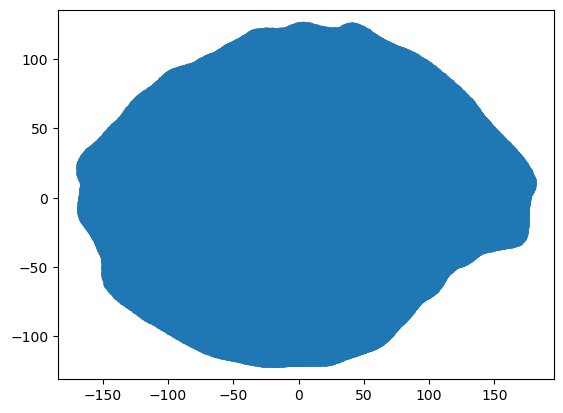

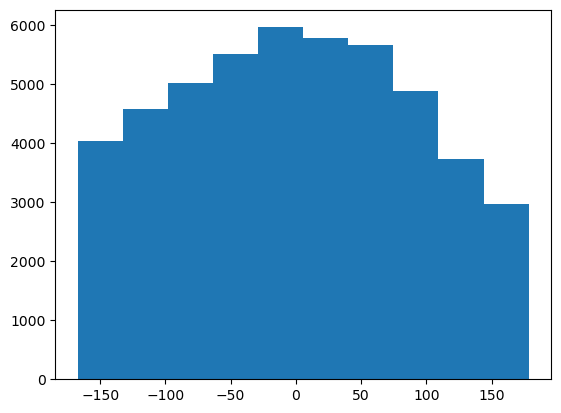

In [10]:
plt.scatter(coor_pca[:, 0], coor_pca[:, 1])
plt.show() 

plt.hist(coor_pca[:, 0])
plt.show() 